In [7]:
import matplotlib.pyplot as plt
import numpy as np 
import torch
import pickle
import pandas as pd
from scipy.stats import entropy, norm

In [8]:
import numpy as np
from scipy.spatial.distance import jensenshannon

def compute_JSD(result_db, target_db, bins=100):

    # 1. 展平数据
    result_flat = result_db.flatten()
    target_flat = target_db.flatten()

    # 2. 计算直方图的范围（保证两者相同）
    data_min = min(result_flat.min(), target_flat.min())
    data_max = max(result_flat.max(), target_flat.max())

    # 3. 计算直方图（相同范围 & 相同 bin）
    result_hist, bin_edges = np.histogram(result_flat, bins=bins, range=(data_min, data_max), density=False)
    target_hist, _ = np.histogram(target_flat, bins=bins, range=(data_min, data_max), density=False)

    # 4. 归一化直方图（转换成概率分布）
    result_prob = result_hist / result_hist.sum()
    target_prob = target_hist / target_hist.sum()

    # 5. 计算 JSD
    jsd_value = jensenshannon(result_prob, target_prob)

    return jsd_value

def compute_NRMSE(result_db, target_db):

    clip_max = np.percentile(result_db, 99)
    clip_min = np.percentile(result_db, 1)
    result_db = np.clip(result_db, a_min=clip_min, a_max=clip_max)

    clip_max = np.percentile(target_db, 99)
    clip_min = np.percentile(target_db, 1)
    target_db = np.clip(target_db, a_min=clip_min, a_max=clip_max)

    # 计算 RMSE
    mse = np.mean((target_db - result_db) ** 2, axis=1)  # 每个样本的 MSE
    rmse = np.sqrt(mse)  # 计算 RMSE

    # 归一化
    nrmse = rmse / (target_db.max(axis=1) - target_db.min(axis=1) + 1e-10)  # 避免除零

    return nrmse.mean()

def compute_MAE(result_db, target_db):

    clip_max = np.percentile(result_db, 99)
    clip_min = np.percentile(result_db, 1)
    result_db = np.clip(result_db, a_min=clip_min, a_max=clip_max)

    clip_max = np.percentile(target_db, 99)
    clip_min = np.percentile(target_db, 1)
    target_db = np.clip(target_db, a_min=clip_min, a_max=clip_max)

    # 计算 MAE (线性尺度)
    mae_linear = np.mean(np.abs(target_db - result_db), axis=1)

    return mae_linear.mean()

In [9]:
path = 'experiments/RSRP-image-96-t200-s320_P_1218_201900/'
stage = '_teacher'
target = np.load(path + f"data_save{stage}/target.npz")['tar_traffic']
generate = np.load(path + f"data_save{stage}/generate.npz")['gen_traffic']
datatype = np.load(path + f"data_save{stage}/datatype.npz")['datatype']

typelist = np.unique(datatype)
indices = {value: np.where(datatype == value)[0] for value in typelist}

In [10]:
save_tar = []
save_gen = []
L = target.shape[-1]

for type, list_i in indices.items():
    save_tar_i = []
    save_gen_i = []
    for i in list_i:
        save_tar_i.append(target[i])
        save_gen_i.append(generate[i])
    save_tar_i = np.array(save_tar_i).reshape(-1, 64)
    save_gen_i = np.array(save_gen_i).reshape(-1, 64)
    shape_base = save_tar_i.shape

    path_cache = path + 'model_save/scaler_' + type + '.pk'
    with open(path_cache, "rb") as f:
        scaler = pickle.load(f)

    # save_tar_i = scaler.inverse_transform(save_tar_i.reshape(-1, 1)).reshape(-1, L)
    save_gen_i = scaler.inverse_transform(save_gen_i.reshape(-1, 1)).reshape(-1, L)
    save_tar_i = save_tar_i.reshape(-1, L)
    save_gen_i = save_gen_i.reshape(-1, L)

    for i in range(len(save_gen_i)):

        gen = save_gen_i[i]
        tar = save_tar_i[i]
        gen = (gen - np.min(gen)) / (np.max(gen) - np.min(gen))

        gen = gen * (np.max(tar) - np.min(tar)) + np.min(tar)

        save_gen_i[i] = gen

    save_tar.append(save_tar_i)
    save_gen.append(save_gen_i)    

**效果分析**

指标计算

In [11]:
obs = 0

In [12]:
print(typelist[obs])

JSD = compute_JSD(save_gen[obs], save_tar[obs])
NRMSE = compute_NRMSE(save_gen[obs], save_tar[obs])
MAE = compute_MAE(save_gen[obs], save_tar[obs])

print(f'JSD: {JSD:.4g}\t')
print(f'NRMSE: {NRMSE:.4g} \t')
print(f'MAE: {MAE:.4g} \t')

RSRP-image-96
JSD: 0.08221	
NRMSE: 0.3875 	
MAE: 7.265 	


In [7]:
# np.savez('./save/Channel-Diff-Image.npz', gen=save_gen[obs], tar=save_tar[obs])

单个图像（合并nsample）

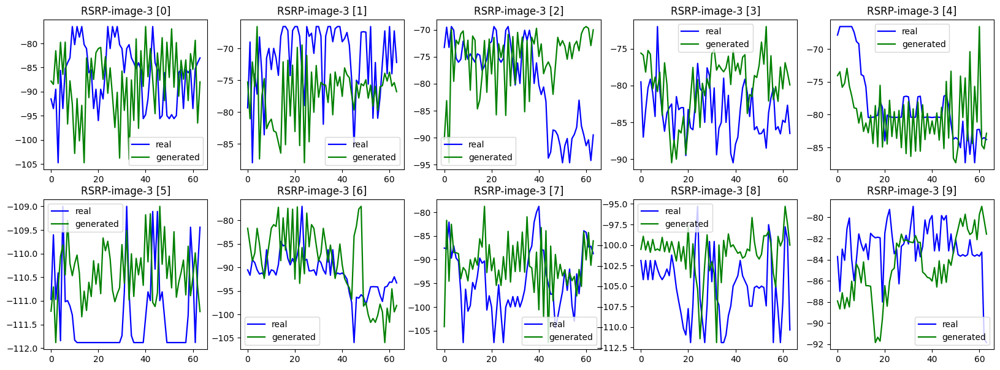

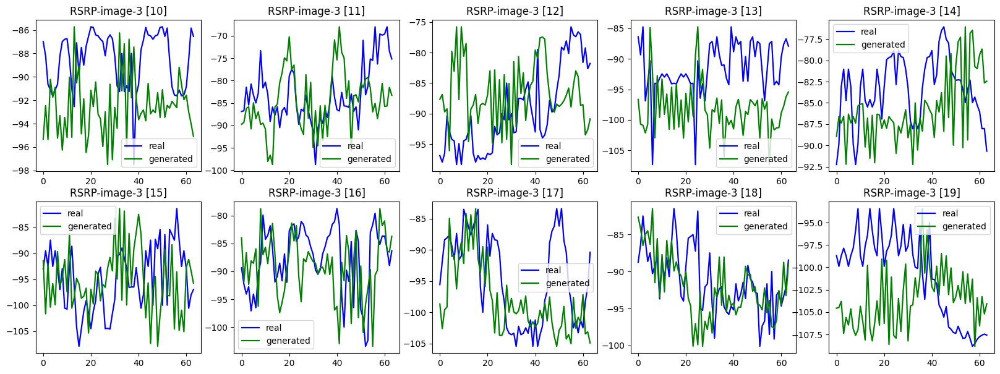

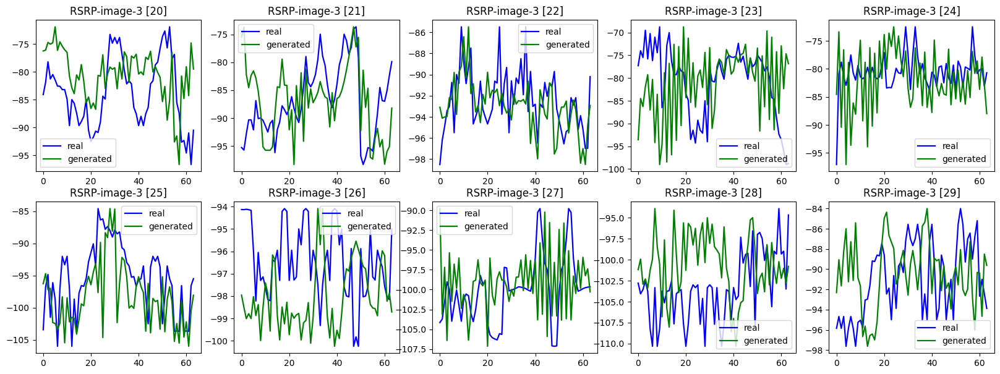

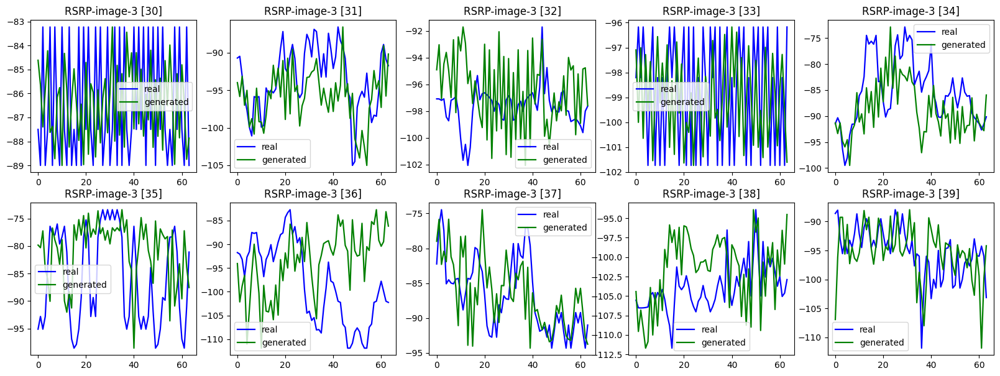

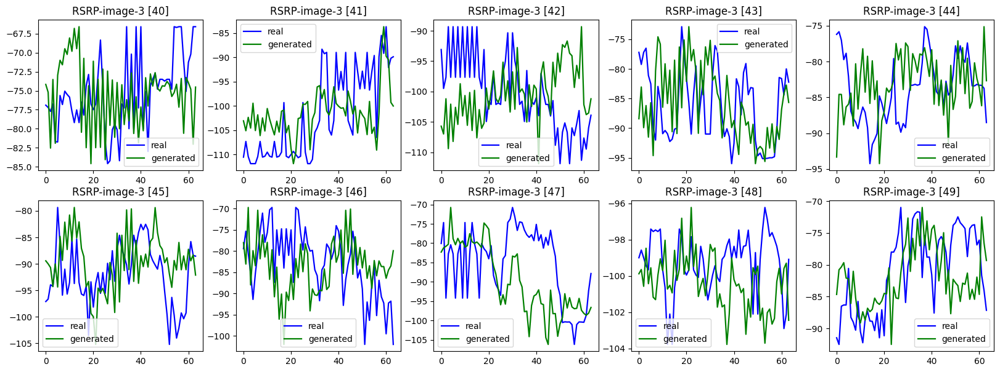

...

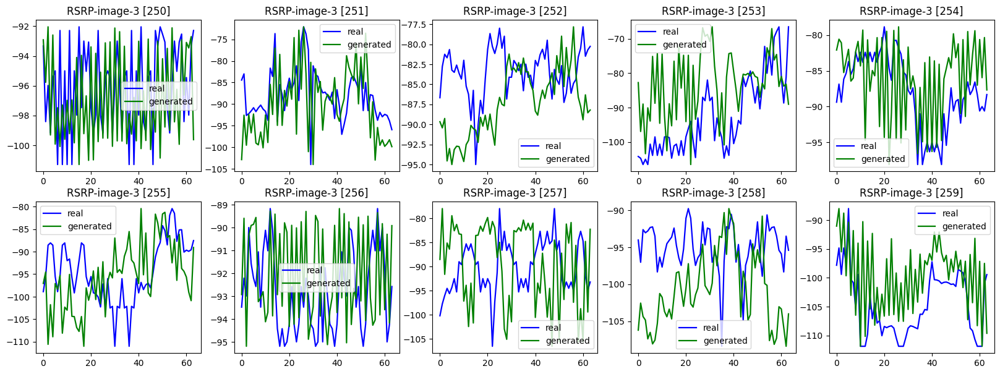

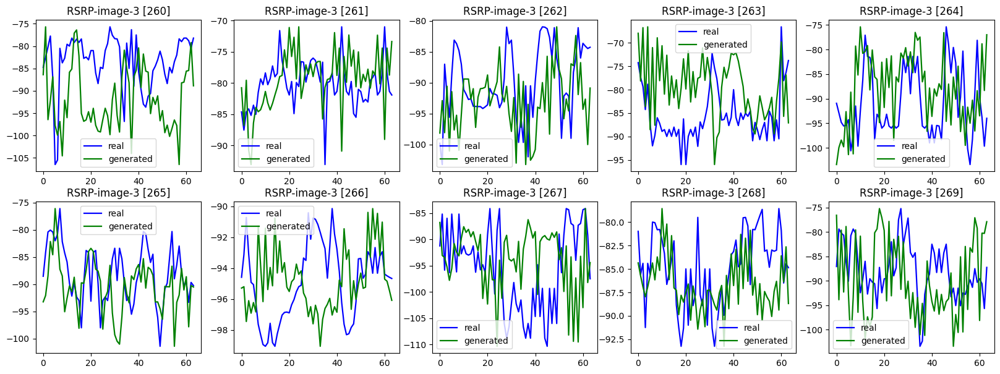

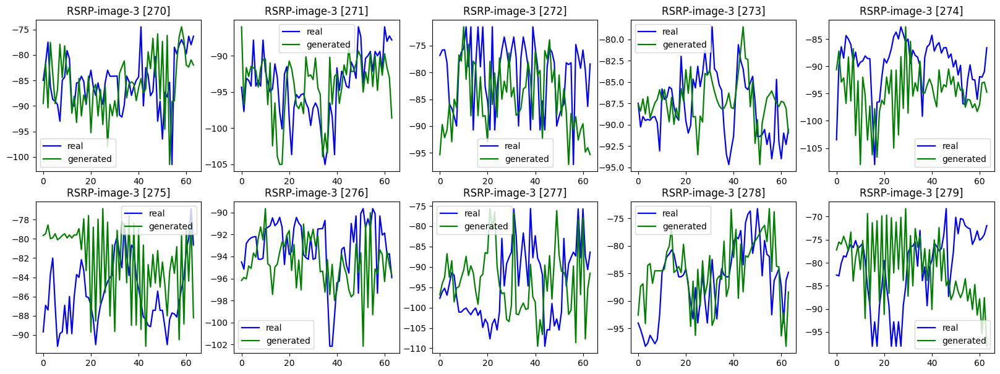

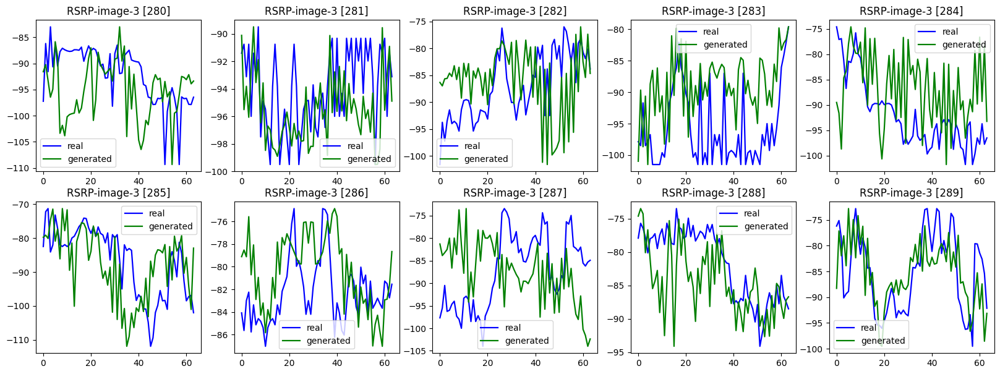

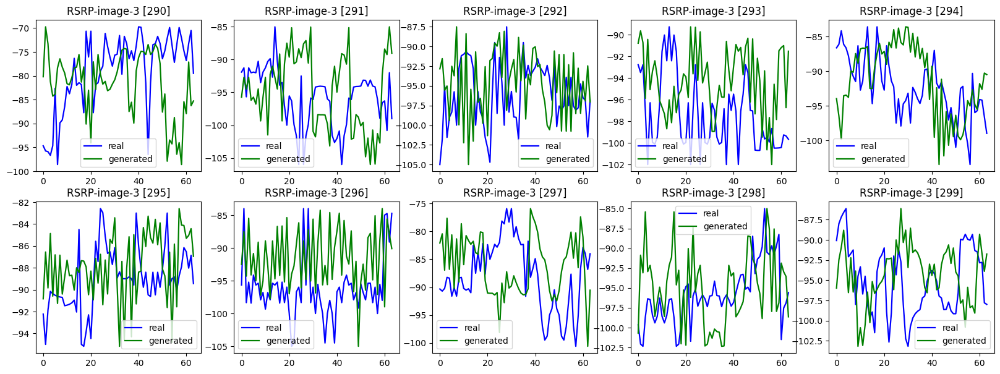

In [56]:
for Add in range(0, 300, 10):

        plt.figure(figsize=(20, 7), dpi=100)
        for i in range(10):
                # Add = 0

                plt.subplot(2, 5, i+1)
                df_target = pd.DataFrame({"x": np.arange(0, L), "val": save_tar[obs][i + Add]})
                plt.plot(df_target.x,
                        df_target.val,
                        color='b',
                        linestyle='solid',
                        label='real',
                        linewidth=1.6)

                df_sample = pd.DataFrame({"x": np.arange(0, L), "val": save_gen[obs][i + Add]})
                plt.plot(df_sample.x,
                        df_sample.val,
                        color='g',
                        linestyle='solid',
                        label='generated',
                        linewidth=1.6)

                plt.title(typelist[obs] + ' [' + str(Add+i) + ']')
                plt.legend()

        plt.show()